In [5]:
import numpy as np 

# Dataset pull

In [32]:

!unzip -q public.zip
!rm public.zip


--2024-03-24 10:09:04--  https://putpoznanpl-my.sharepoint.com/:u:/g/personal/dominik_pieczynski_put_poznan_pl/EWIZ_xm8wXpMjQDgF2VQ1csB4QuHPKoj5vDpj6CQi9p-AA?e=yQr6fn&download=1
Resolving putpoznanpl-my.sharepoint.com (putpoznanpl-my.sharepoint.com)... 13.107.136.10, 13.107.138.10, 2620:1ec:8f8::10, ...
Connecting to putpoznanpl-my.sharepoint.com (putpoznanpl-my.sharepoint.com)|13.107.136.10|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /personal/dominik_pieczynski_put_poznan_pl/Documents/Public.zip?ga=1 [following]
--2024-03-24 10:09:04--  https://putpoznanpl-my.sharepoint.com/personal/dominik_pieczynski_put_poznan_pl/Documents/Public.zip?ga=1
Reusing existing connection to putpoznanpl-my.sharepoint.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 5672415949 (5.3G) [application/x-zip-compressed]
Saving to: 'public.zip'

public.zip          100%[===================>]   5.28G  59.6MB/s    in 81s     

2024-03-24 10:10:26 (66.5 MB/s) - 'pub

In [3]:
!pip install --upgrade nibabel

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 11.6 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: nibabel
    Found existing installation: nibabel 5.2.0
    Uninstalling nibabel-5.2.0:
      Successfully uninstalled nibabel-5.2.0


In [33]:
!ls -1 /kaggle/working/FirstDataset/train | wc -l

#!rm -r /kaggle/working/lightning_logs


574


# Premade Functions

In [10]:
import numpy as np
import nibabel as nib

from typing import Tuple, List
from pathlib import Path


# https://nipy.org/nibabel/nibabel_images.html

def load_raw_volume(path: Path) -> Tuple[np.ndarray, np.ndarray]:
    data: nib.Nifti1Image = nib.load(str(path))
    data = nib.as_closest_canonical(data)
    raw_data = data.get_fdata(caching='unchanged', dtype=np.float32)
    return raw_data, data.affine


def load_labels_volume(path: Path) -> np.ndarray:
    return load_raw_volume(path)[0].astype(np.uint8)


def save_labels(data: np.ndarray, affine: np.ndarray, path: Path):
      nib.save(nib.Nifti1Image(data, affine), str(path))


def show_slices(slices: List[np.ndarray],cmap="gray"):
        fig, axes = plt.subplots(1, len(slices))
        for i, data_slice in enumerate(slices):
            axes[i].imshow(data_slice.T, cmap=cmap, origin="lower")

# Visual

In [7]:
!pip install ipywidgets

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


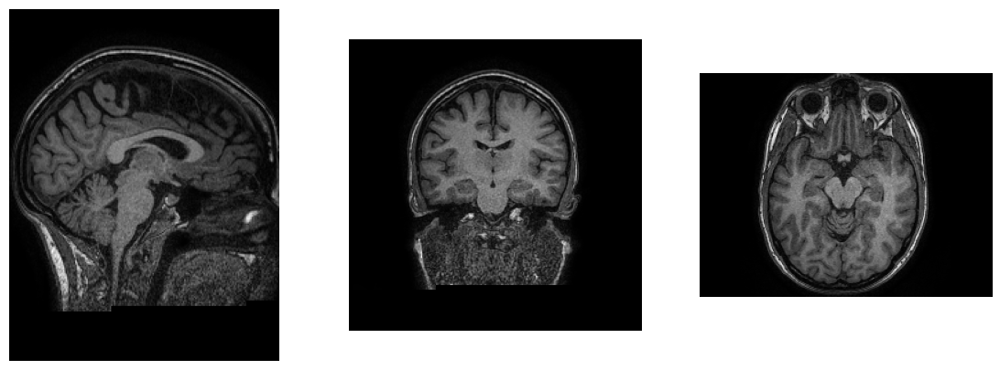

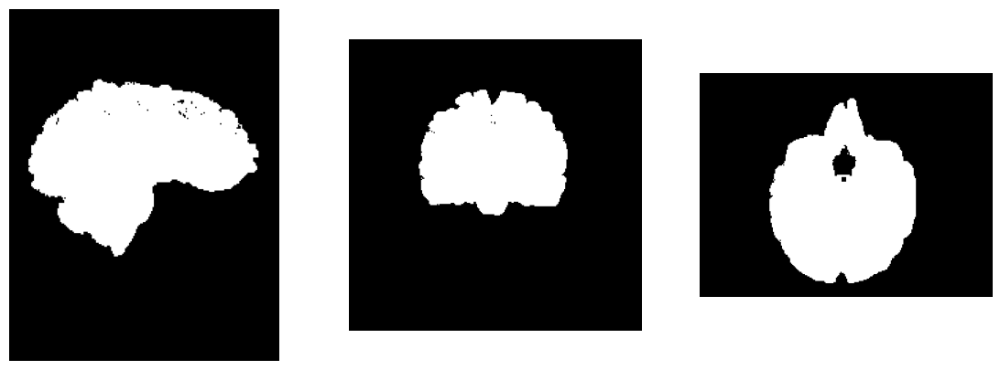

In [9]:
import matplotlib.pyplot as plt

# Zmienna affine zawiera macierz, która będzie potrzebna przy zapisie predykcji do pliku
raw_volume, affine = load_raw_volume('/kaggle/working/FirstDataset/train/ca187bff525d7dec725f61d48b3197d2.nii.gz')
mask_volume = load_labels_volume('/kaggle/working/FirstDataset/train/ca187bff525d7dec725f61d48b3197d2_mask.nii.gz')

# Print the whole array without ellipsis
np.set_printoptions(edgeitems=3, linewidth=80, precision=8, suppress=False, threshold=1000, formatter=None)
print(mask_volume[mask_volume.shape[0] // 2])

show_slices([raw_volume[raw_volume.shape[0] // 2], # Środkowy slice 2D w osi x
             raw_volume[:, raw_volume.shape[1] // 2], # Środkowy slice 2D w osi y
             raw_volume[:, :, raw_volume.shape[2] // 2]]) # Środkowy slice 2D w osi z

show_slices([mask_volume[mask_volume.shape[0] // 2], # Środkowy slice 2D w osi x
             mask_volume[:, mask_volume.shape[1] // 2], # Środkowy slice 2D w osi y
             mask_volume[:, :, mask_volume.shape[2] // 2]]) # Środkowy slice 2D w osi z

interactive(children=(IntSlider(value=128, description='x', max=255), IntSlider(value=98, description='y', max…

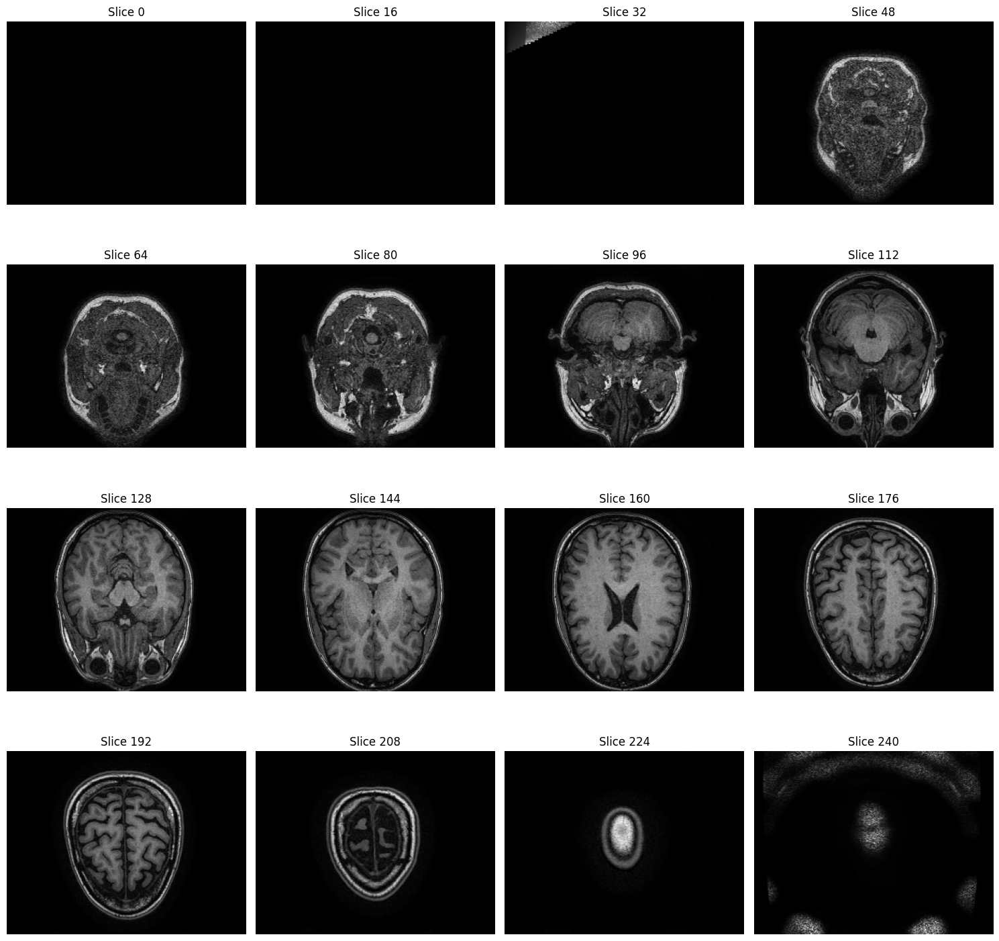

In [36]:
import matplotlib.pyplot as plt

def plot_slices(data,xyz=2, cmap='viridis'):
    num_total_slices = data.shape[xyz]
    rows = 4
    cols = 4

    # Calculate the step based on the total number of slices and desired number of slices
    step = max(num_total_slices // (rows * cols), 1)

    fig, axs = plt.subplots(rows, cols, figsize=(15, 15))

    for i in range(rows):
        for j in range(cols):
            slice_idx = i * cols + j
            # Ensure the slice index doesn't go out of bounds
            if slice_idx * step >= num_total_slices:
                break
            if (xyz==2):
                axs[i, j].imshow(data[:,:, slice_idx * step].T, cmap=cmap)
            elif (xyz==1):
                  axs[i, j].imshow(data[:, slice_idx * step], cmap=cmap)
            elif (xyz==0):
                  axs[i, j].imshow(data[ slice_idx * step], cmap=cmap)
            else:
                print("incorrect xyz choose (0,1,2)")
                break



            axs[i, j].set_title(f"Slice {slice_idx * step}")
            axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# Plot slices along the Z-axis (axial slices)
plot_slices(raw_volume,2,'gray')




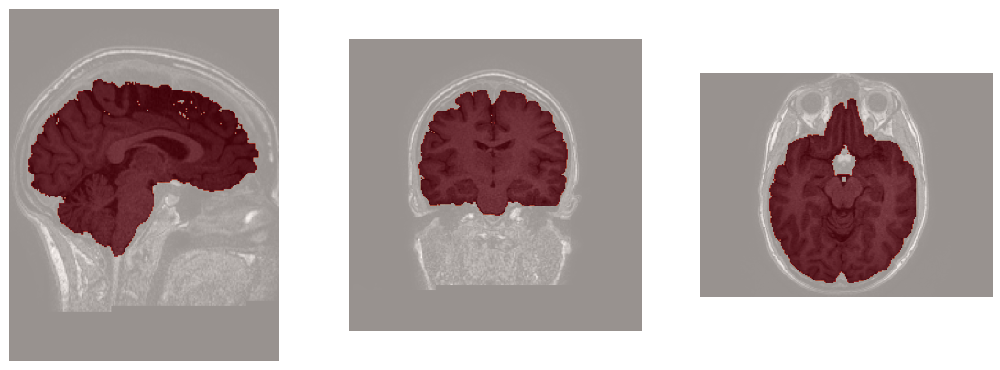

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact
import ipywidgets as widgets

def show_slices(slices, mask_slices=None):
    fig, axes = plt.subplots(1, len(slices), figsize=(14, 5))  # Increase figsize for larger plots
    for i, data_slice in enumerate(slices):
        axes[i].imshow(data_slice.T, cmap="gray", origin="lower")
        if mask_slices is not None:
            axes[i].imshow(mask_slices[i].T, cmap="Reds", alpha=0.6, origin="lower")
        axes[i].axis('off')
    plt.show()

# Define the function to create interactive plots
def plot_interactive_slices(volume, mask_volume=None):
    @interact(x=widgets.IntSlider(min=0, max=volume.shape[0]-1, step=1, value=volume.shape[0] // 2),
              y=widgets.IntSlider(min=0, max=volume.shape[1]-1, step=1, value=volume.shape[1] // 2),
              z=widgets.IntSlider(min=0, max=volume.shape[2]-1, step=1, value=volume.shape[2] // 2))
    def interactive_slices(x, y, z):
        raw_slices = [volume[x, :, :],
                      volume[:, y, :],
                      volume[:, :, z]]
        mask_slices = None
        if mask_volume is not None:
            mask_slices = [mask_volume[x, :, :],
                           mask_volume[:, y, :],
                           mask_volume[:, :, z]]
        # Show the slices with or without mask overlay
        show_slices(raw_slices, mask_slices)

# Call the interactive plot function with the raw_volume and mask_volume
plot_interactive_slices(raw_volume, mask_volume)


# Creating dataset subfolder struct

In [39]:
first_dataset_path = Path('/kaggle/working/FirstDataset/train')
second_dataset_path = Path('/kaggle/working/SecondDataset/train')
#!pip install --upgrade nibabel



In [40]:
from tqdm import tqdm
import numpy as np
from pathlib import Path
import nibabel as nib
from sklearn.model_selection import train_test_split
import os
import cv2

data_dir = Path("/kaggle/working/FirstDataset/train")
subject_files = list(data_dir.glob("*_mask.nii.gz"))
subjects = [file.stem.split('_')[0] for file in subject_files]

train_subjects, val_subjects = train_test_split(subjects, test_size=0.2, random_state=42)

def process_subjects(subject_list, output_dir):
    for subject_id in tqdm(subject_list, desc="Processing Data"):
        image_path = data_dir / f"{subject_id}.nii.gz"
        mask_path = data_dir / f"{subject_id}_mask.nii.gz"

        image, affine = load_raw_volume(image_path)
        mask = load_labels_volume(mask_path)

        # Create subdirectories
        subject_dir = os.path.join(output_dir, f"{subject_id}")
        os.makedirs(subject_dir, exist_ok=True)

        # Create subdirectories for T1 and masks
        t1_dir = os.path.join(subject_dir, "T1")
        mask_dir = os.path.join(subject_dir, "Masks")
        os.makedirs(t1_dir, exist_ok=True)
        os.makedirs(mask_dir, exist_ok=True)

        # Process and save each slice
        for i in range(image.shape[1]):
            slice_image = image[:, i, :]
            slice_mask = mask[:, i, :]
            # Save T1 image
            image_filename = os.path.join(t1_dir, f"Y-{i}.png")
            cv2.imwrite(image_filename, slice_image)

            # Save mask
            mask_filename = os.path.join(mask_dir, f"Y-{i}mask.png")

            # Assuming slice_mask contains binary values (0 and 1)
            # Scale the binary mask to [0, 255]
            scaled_mask = (slice_mask * 255).astype(np.uint8)
            # Save the scaled binary mask
            cv2.imwrite(mask_filename, scaled_mask)

# Process training subjects
train_output_dir = "/kaggle/working/FirstDataset/trainpngy"
process_subjects(train_subjects, train_output_dir)

# Process validation subjects
val_output_dir = "/kaggle/working/FirstDataset/valpngy"
process_subjects(val_subjects, val_output_dir)

print("Train subjects:", train_subjects)
print("Validation subjects:", val_subjects)


Processing Data: 100%|██████████| 58/58 [00:34<00:00,  1.70it/s]

Train subjects: ['ef6519cc2a0703ed78f3d38ae832d8da', '9a996042b63b0d2a2514cb70f465284d', '83182c5425f81a4ab116d680ba4a27f9', 'e2ce5b719c88ac6656aff908870c204b', '3cdcfd4cde291448c9942bb1b45fa7d7', '3f7b1d4641cf3fd007effa36f8c87811', 'a4668fc3679a7c87ad5b4ec5a8f0f959', 'bb9f4f79ea935f0f2fe052845fb18916', '4574a48cdbd803e41eaedb4ad5284083', 'ea5ec0092dc0b60e4289995d36aab4ef', '5121112e67777a6ef0279a2b0d0eab0a', '0b3ea09bb26b17af2b596e96875d2ca2', 'f2480c597c39845b9ba4d1d0714c3940', '6fa86294da51db647a7f78ac8038a019', '6d3e82944ef5fddaf3b9bfdcd146558b', '2e95bc23d0d3d1b2fcb152b5d8e55a75', 'ad9dbd2a0719b6c89332fa13dae33c50', '6461dd16b22690f10b96e04f4f859015', '755be9c7e1dfc007f88ea847e9a0cf51', '77615dc4b68661aa9f68185d846960c1', 'b76e06ed30fcb27a2f39d61f5f12b713', '77ff0872fc2b9740169f9de1093f1c65', 'cba0de8d5a8dd1271c50f593e32596c8', '4b478332111404d5ee67d06cb8c01e74', '8042e0bfec57c355b8d0d016bc1db213', 'b70696ad0a9158805479026052367ffc', '976e47d395894e0dcc56694083ed13aa', 'e66ce7e96b

In [44]:
!ls -1 /kaggle/working/FirstDataset/trainpngy | wc -l

229


# Custom Dataset dataloader

In [45]:
import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset
from torchvision.transforms import ToPILImage, Resize, ToTensor, Compose
import re

def sort_numerically(file_name):
    """Helper function to extract numerical part from the filename for sorting."""
    numbers = re.findall(r'\d+', file_name)
    return int(numbers[0]) if numbers else 0

class CustomDataset(Dataset):
    def __init__(self, root_dir, target_size=(256, 256)):
        self.root_dir = root_dir
        self.subjects = sorted(os.listdir(root_dir))
        self.target_size = target_size
        self.indices_mapping = self._create_indices_mapping()

        self.transform_image = Compose([
            ToPILImage(),
            Resize(target_size),
            ToTensor(),
        ])
        
        self.transform_mask = Compose([
            ToPILImage(),
            Resize(target_size),
            ToTensor(),
        ])

    def _create_indices_mapping(self):
        mapping = []
        for subject in self.subjects:
            t1_dir = os.path.join(self.root_dir, subject, "T1")
            t1_files = sorted(os.listdir(t1_dir), key=sort_numerically)
            for t1_file in t1_files:
                mapping.append((subject, t1_file))
        return mapping

    def __len__(self):
        return len(self.indices_mapping)

    def __getitem__(self, idx):
        subject, t1_file = self.indices_mapping[idx]
        subject_dir = os.path.join(self.root_dir, subject)
        t1_dir = os.path.join(subject_dir, "T1")
        mask_dir = os.path.join(subject_dir, "Masks")

        t1_path = os.path.join(t1_dir, t1_file)
        # Construct mask filename from T1 filename
        mask_file = t1_file.replace('.png', 'mask.png')
        mask_path = os.path.join(mask_dir, mask_file)

        t1 = cv2.imread(t1_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        t1 = self.transform_image(t1)
        mask = self.transform_mask(mask)

        return t1, mask


# PL and TM

In [29]:
!pip install pytorch_lightning
!pip install torchmetrics

In [46]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DiceLoss(nn.Module):
      def forward(self, y_pred: torch.Tensor, y: torch.Tensor) -> torch.Tensor:
        y_pred = torch.sigmoid(y_pred)
        intersection = torch.sum(y_pred * y)
        return 1. - (2 * intersection + 1.) / (y_pred.sum() + y.sum() + 1.)
    


class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets):
        BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction='none')
        targets = targets.type(torch.long)
        at = self.alpha * targets + (1 - self.alpha) * (1 - targets)
        pt = torch.exp(-BCE_loss)
        F_loss = at * (1 - pt) ** self.gamma * BCE_loss
        return F_loss.mean()

    
class CombinedLoss(nn.Module):
    def __init__(self, alpha=0.5, gamma=2.0, smooth=1e-6):
        super(CombinedLoss, self).__init__()
        self.alpha = alpha
        self.focal_loss = FocalLoss(alpha=alpha, gamma=gamma)
        self.dice_loss = DiceLoss()

    def forward(self, inputs, targets):
        loss = self.focal_loss(inputs, targets) + self.dice_loss(inputs, targets)
        return loss


# Unet Definition

In [47]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import pytorch_lightning as pl
from torch.utils.data import DataLoader
import torch
from torch import nn


class UNet(nn.Module):
    
    def __init__(self, in_channels: int, num_classes: int):
        super().__init__()

        self.down1 = DownBlock(in_channels=in_channels, out_channels=64)
        self.down2 = DownBlock(in_channels=64, out_channels=128)
        self.down3 = DownBlock(in_channels=128, out_channels=256)
        self.down4 = DownBlock(in_channels=256, out_channels=512)

        self.conv = DoubleConv(in_channels=512, out_channels=1024)

        self.up1 = UpBlock(in_channels=1024, out_channels=512)
        self.up2 = UpBlock(in_channels=512, out_channels=256)
        self.up3 = UpBlock(in_channels=256, out_channels=128)
        self.up4 = UpBlock(in_channels=128, out_channels=64)

        self.out_conv = nn.Conv2d(in_channels=64, out_channels=num_classes,
                                  kernel_size=(1, 1))


    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x, x1 = self.down1(x)
        x, x2 = self.down2(x)
        x, x3 = self.down3(x)
        x, x4 = self.down4(x)

        x = self.conv(x)

        x = self.up1(x, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)

        x = self.out_conv(x)

        return x


class UpBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()

        self.up_conv = UpConv(in_channels)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x: torch.Tensor, x_encoder: torch.Tensor) -> torch.Tensor:
        x = self.up_conv(x)
        x = torch.cat([x_encoder, x], dim=1)
        x = self.conv(x)
        return x


class UpConv(nn.Module):
    def __init__(self, in_channels: int):
        super().__init__()

        self.upsample = nn.UpsamplingNearest2d(scale_factor=(2, 2))
        self.conv = nn.Conv2d(in_channels, in_channels // 2, kernel_size=(1, 1))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.upsample(x)
        x = self.conv(x)
        return x


class DownBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()

        self.conv = DoubleConv(in_channels, out_channels)
        self.max_pool = nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2))

    def forward(self, x: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor]:
        x = self.conv(x)
        return self.max_pool(x), x


class DoubleConv(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()

        self.relu = nn.ReLU(inplace=True)
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=(3, 3),
                               padding=(1, 1))
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=(3, 3),
                               padding=(1, 1))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.relu(x)
        return x




class UNetModel(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model
        #self.loss_function = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss
        #self.loss_function = DiceLoss()
        self.dice=DiceLoss()
        self.loss_function=CombinedLoss()

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_pred = self.model(x)
        loss = self.loss_function(y_pred, y)
        self.log('train_loss', loss,prog_bar=True)
        
        dicec= 1.0 -self.dice(y_pred,y)
        self.log('dice coeff: ',dicec, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_pred = self.model(x)
        loss = self.loss_function(y_pred, y)
        self.log('val_loss: ', loss, prog_bar=True)
        
        dicec= 1.0 -self.dice(y_pred,y)
        self.log('dice coeff: ',dicec, prog_bar=True)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-4)
        return optimizer


model = UNet(in_channels=1, num_classes=1)
model(torch.randn(4, 1, 256, 256)).shape

torch.Size([4, 1, 256, 256])

In [48]:
model = UNet(in_channels=1, num_classes=1)
model(torch.randn(4, 1, 256, 256)).shape

torch.Size([4, 1, 256, 256])

In [ ]:
!pip install segmentation_models_pytorch

In [49]:
train_dir = "/kaggle/working/FirstDataset/trainpngy"
val_dir = "/kaggle/working/FirstDataset/valpngy"


train_dataset = CustomDataset(train_dir,  target_size=(256, 256))
val_dataset = CustomDataset(val_dir,  target_size=(256, 256))

Training Samples:


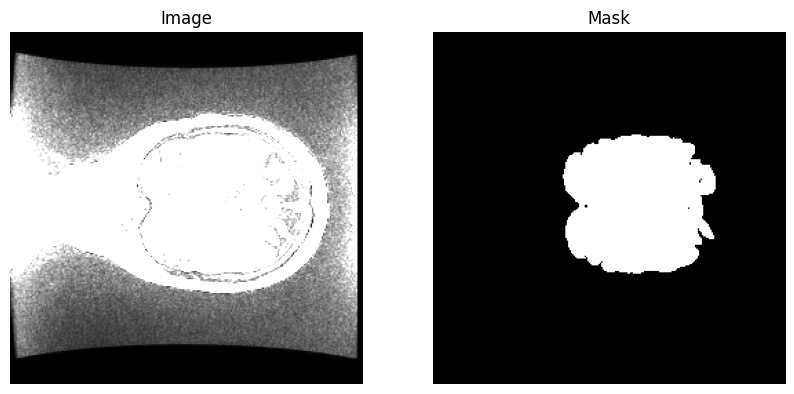

Sample index: 240
Image type: <class 'torch.Tensor'>, Image shape: torch.Size([1, 256, 256])
Mask type: <class 'torch.Tensor'>, Mask shape: torch.Size([1, 256, 256])


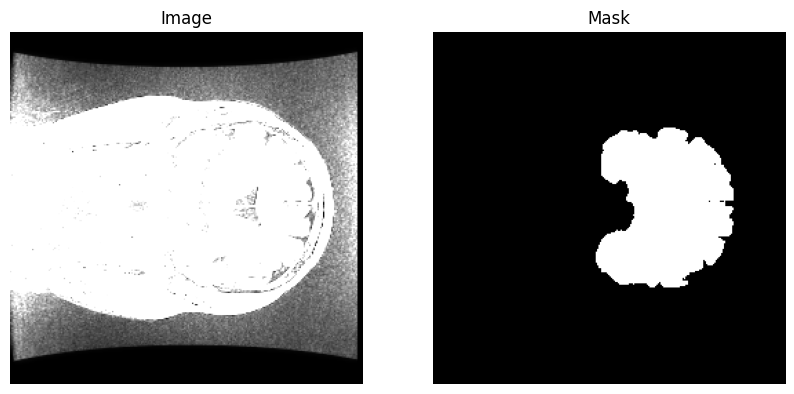

Sample index: 120
Image type: <class 'torch.Tensor'>, Image shape: torch.Size([1, 256, 256])
Mask type: <class 'torch.Tensor'>, Mask shape: torch.Size([1, 256, 256])


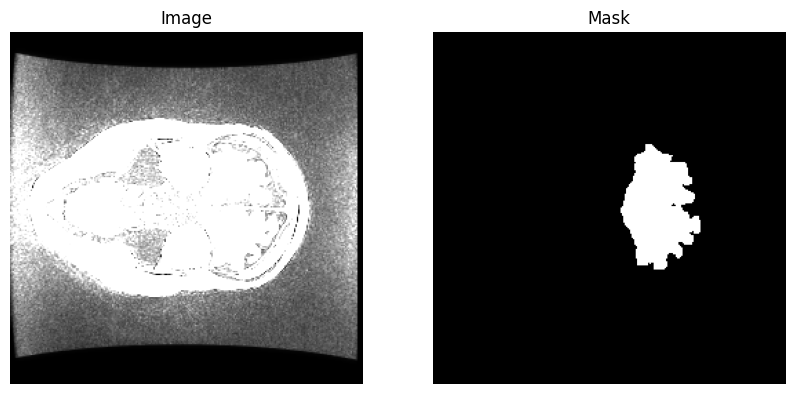

Sample index: 360
Image type: <class 'torch.Tensor'>, Image shape: torch.Size([1, 256, 256])
Mask type: <class 'torch.Tensor'>, Mask shape: torch.Size([1, 256, 256])

Validation Samples:


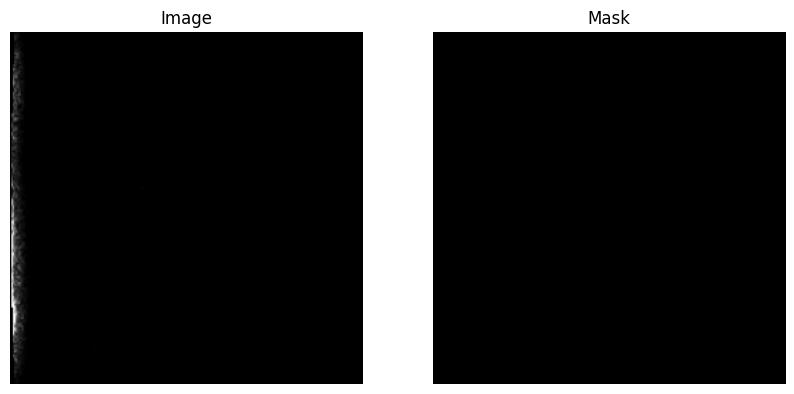

Sample index: 240
Image type: <class 'torch.Tensor'>, Image shape: torch.Size([1, 256, 256])
Mask type: <class 'torch.Tensor'>, Mask shape: torch.Size([1, 256, 256])


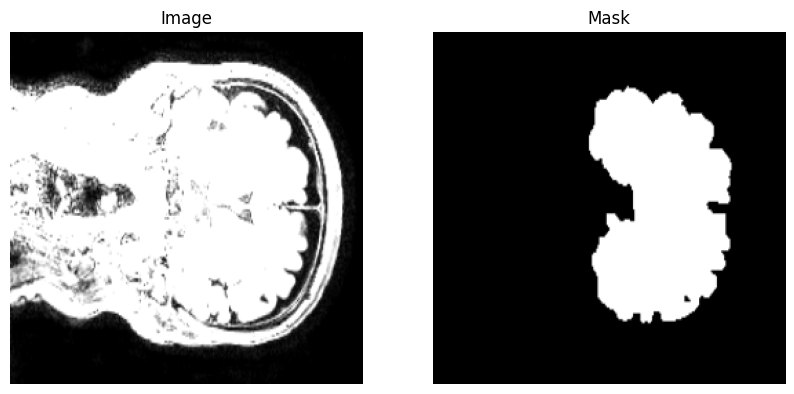

Sample index: 120
Image type: <class 'torch.Tensor'>, Image shape: torch.Size([1, 256, 256])
Mask type: <class 'torch.Tensor'>, Mask shape: torch.Size([1, 256, 256])


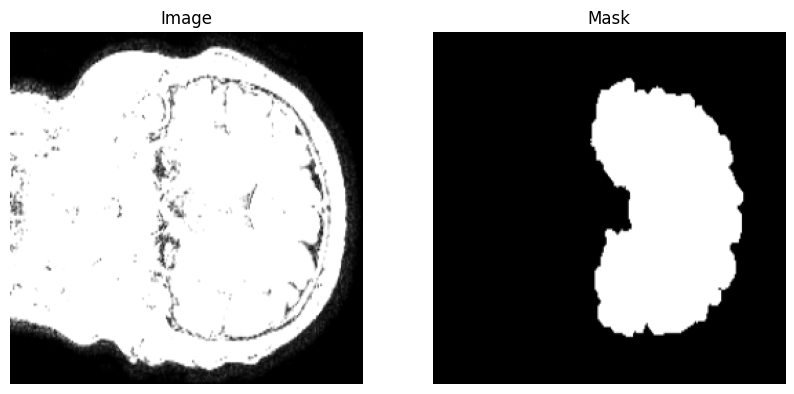

Sample index: 360
Image type: <class 'torch.Tensor'>, Image shape: torch.Size([1, 256, 256])
Mask type: <class 'torch.Tensor'>, Mask shape: torch.Size([1, 256, 256])


In [50]:
import matplotlib.pyplot as plt

def show_image_mask(image, mask):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    ax1.imshow(image.squeeze(), cmap='gray')  
    ax1.set_title('Image')
    ax1.axis('off')
    
    ax2.imshow(mask.squeeze(), cmap='gray') 
    ax2.set_title('Mask')
    ax2.axis('off')
    
    plt.show()

def display_samples_and_info(dataset, indices):
    for idx in indices:
        image, mask = dataset[idx]
        
        
        image_np = image.squeeze().numpy()
        mask_np = mask.squeeze().numpy()
        
        show_image_mask(image_np, mask_np)
        
        print(f'Sample index: {idx}')
        print(f'Image type: {type(image)}, Image shape: {image.shape}')
        print(f'Mask type: {type(mask)}, Mask shape: {mask.shape}')


dfg=120
sample_indices = [dfg*2, dfg, dfg*3]  
print("Training Samples:")
display_samples_and_info(train_dataset, sample_indices)

print("\nValidation Samples:")
display_samples_and_info(val_dataset, sample_indices)


# Training Loop

In [51]:
import torch.nn.functional as F
import pytorch_lightning as pl
from torch.utils.data import DataLoader

#model = UNet(in_channels=1, out_channels=1)

batch_size = 16

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=3)

val_loader = DataLoader(val_dataset, batch_size=batch_size,num_workers=3)

unet_model = UNetModel(model)

trainer = pl.Trainer(max_epochs=1,accelerator='gpu')

trainer.fit(unet_model, train_loader, val_loader)




2024-03-24 10:39:45.540855: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-24 10:39:45.540960: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-24 10:39:45.843671: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

# Evaluation

In [52]:
import torch
import numpy as np
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# Assuming unet_model is your model's variable name
unet_model = unet_model.to(device)  # Ensure the model is on the correct device
unet_model.eval()

# Functions for metrics calculations should be adjusted to work with PyTorch tensors directly
def dice_coefficient(pred, target):
    smooth = 1e-6
    intersection = (pred * target).sum()
    return (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

def intersection_over_union(pred, target):
    smooth = 1e-6
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    return (intersection + smooth) / (union + smooth)

def accuracy(pred, target):
    correct = (pred == target).float().sum()  # Use .float() to ensure floating point division
    total = pred.numel()  # Use .numel() to get the number of elements in the tensor
    return correct / total

dice_scores = []
iou_scores = []
acc_scores = []

for batch in val_loader:
    x, y_true = batch[0].to(device), batch[1].to(device)  # Move data to the same device as the model
    with torch.no_grad():
        y_pred = unet_model(x)
        y_pred = torch.sigmoid(y_pred)  # Apply sigmoid to get probabilities
        
        # Threshold predictions to get binary mask
        y_pred_thresh = (y_pred > 0.5).float()

        # Compute evaluation metrics directly with tensors on the device
        dice_score = dice_coefficient(y_pred_thresh, y_true)
        iou_score = intersection_over_union(y_pred_thresh, y_true)
        acc_score = accuracy(y_pred_thresh, y_true)
        
        dice_scores.append(dice_score.item())
        iou_scores.append(iou_score.item())
        acc_scores.append(acc_score.item())

# Calculate average scores
avg_dice = np.mean(dice_scores)
avg_iou = np.mean(iou_scores)
avg_acc = np.mean(acc_scores)

print(f"Average Dice Coefficient: {avg_dice}")
print(f"Average IoU (Intersection over Union): {avg_iou}")
print(f"Average Accuracy: {avg_acc}")


Average Dice Coefficient: 0.925478033240726
Average IoU (Intersection over Union): 0.8893283307156106
Average Accuracy: 0.9892804181134259


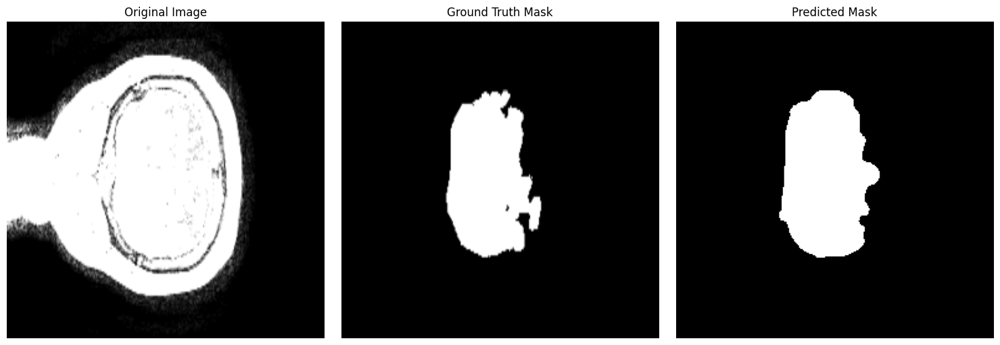

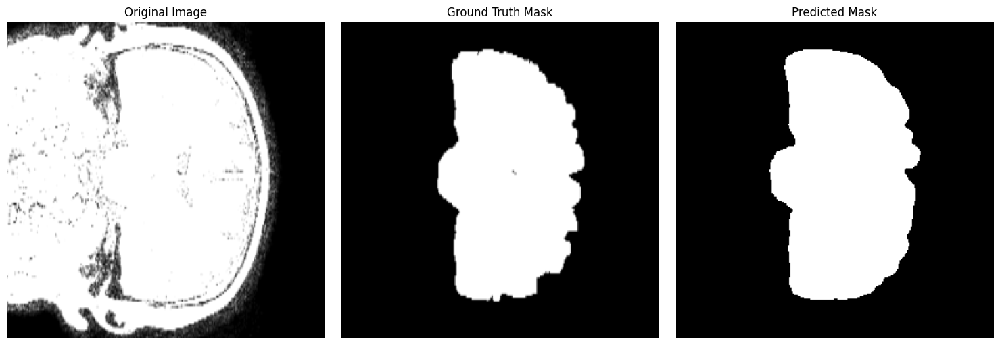

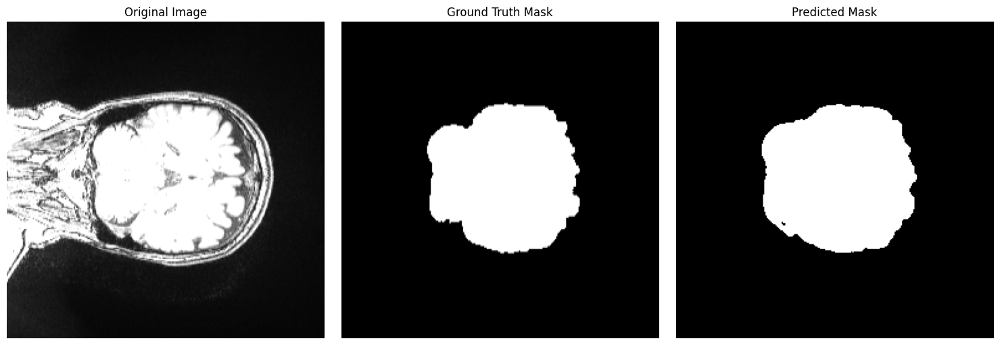

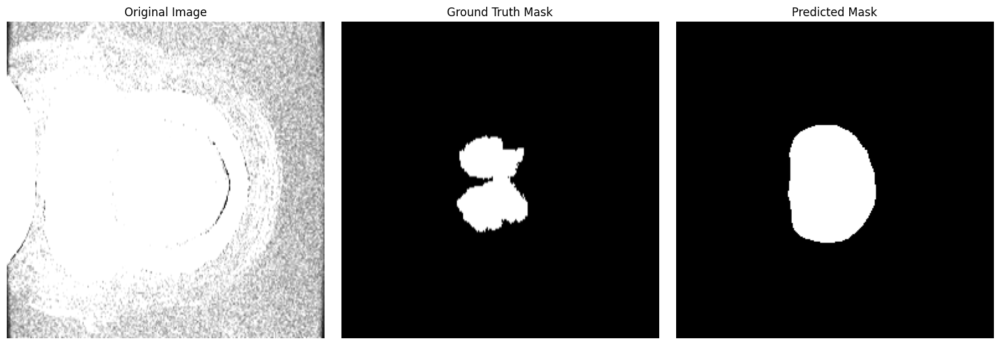

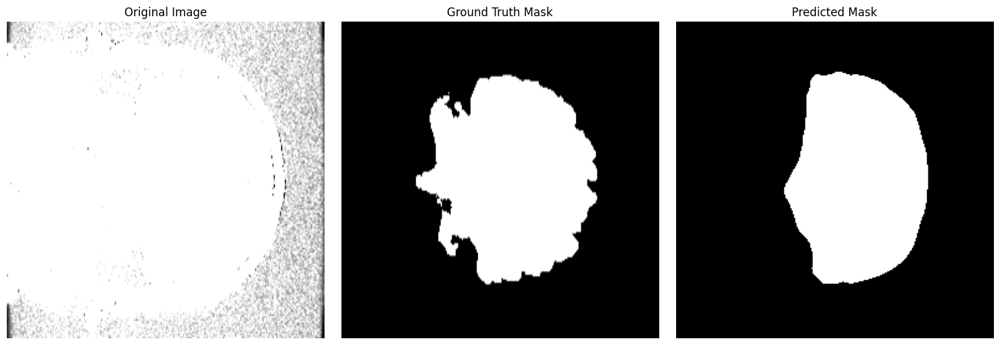

...

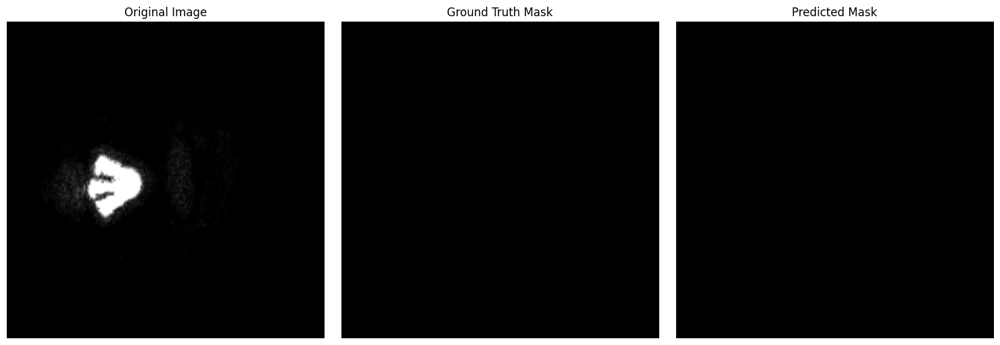

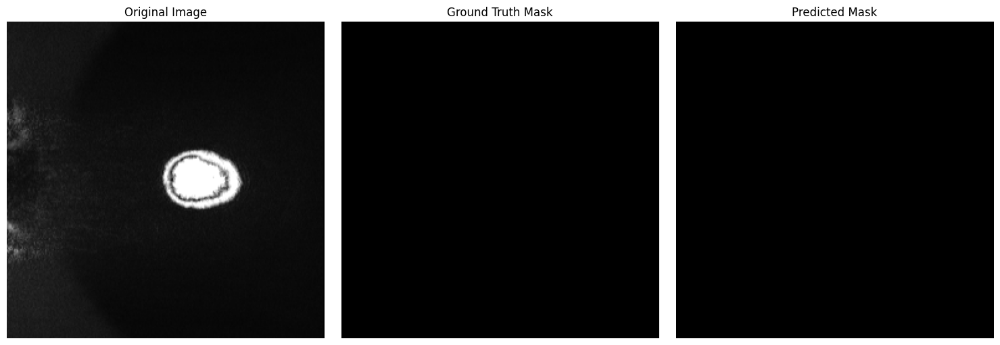

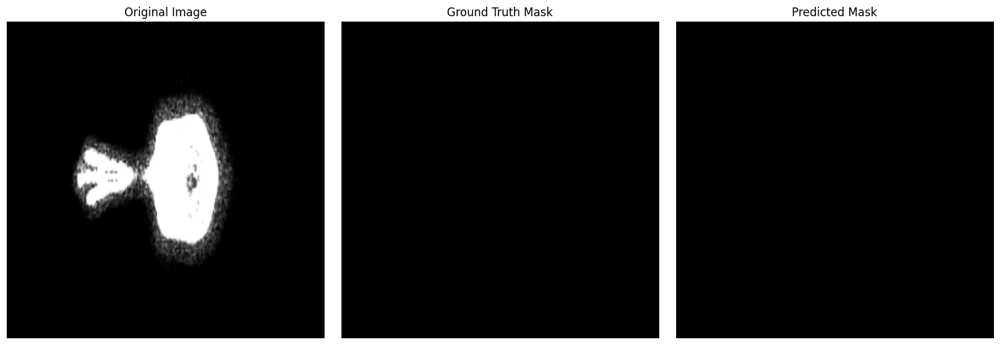

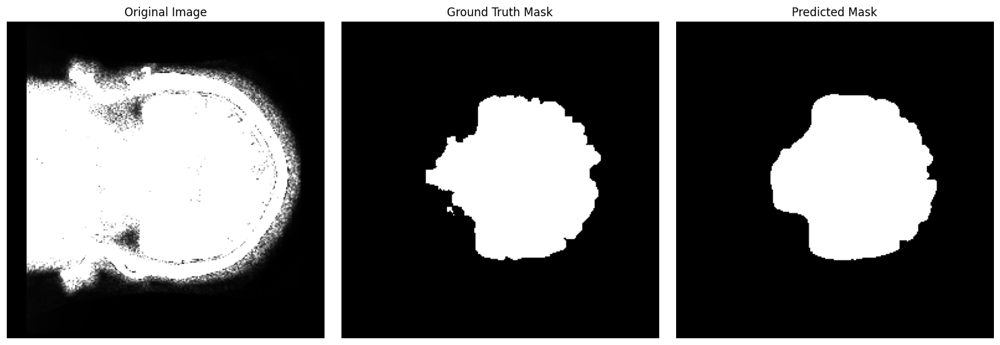

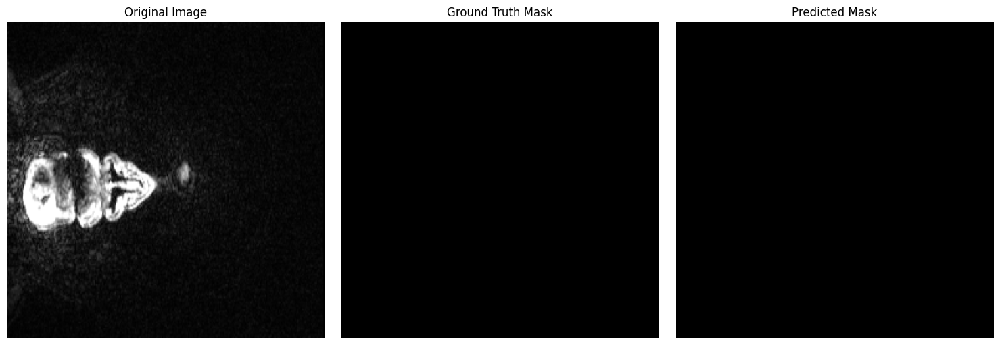

In [54]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# Assuming val_loader is your DataLoader for the validation set
# Make sure unet_model is set to evaluation mode and moved to the correct device
unet_model.eval()

# Number of random samples to display
num_samples = 21

# Generate random batch indices
num_batches = len(val_loader)  # Assuming val_loader has a defined length
random_batch_indices = np.random.choice(num_batches, size=num_samples, replace=False)

for batch_idx, (x, y_true) in enumerate(val_loader):
    if batch_idx in random_batch_indices:
        # Move data to the same device as the model
        x, y_true = x.to(device), y_true.to(device)
        
        with torch.no_grad():
            y_pred = unet_model(x)
            y_pred = torch.sigmoid(y_pred)  # Apply sigmoid to get probabilities
            y_pred_thresh = (y_pred > 0.5).float()  # Threshold predictions
            
        # Select a random sample index from the batch (all samples in the batch are potential candidates)
        sample_idx = np.random.randint(0, x.size(0))
        
        # Prepare the images, masks, and predictions for plotting
        image = x[sample_idx][0].cpu().numpy()  # Assuming the first channel is what you want to display
        mask_true = y_true[sample_idx][0].cpu().numpy()
        prediction = y_pred_thresh[sample_idx][0].cpu().numpy()
        
        # Squeeze the single-channel dimension
        image = np.squeeze(image)
        mask_true = np.squeeze(mask_true)
        prediction = np.squeeze(prediction)
        
        # Plot
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(image, cmap='gray')
        axes[0].set_title("Original Image")
        axes[0].axis('off')

        axes[1].imshow(mask_true, cmap='gray')
        axes[1].set_title("Ground Truth Mask")
        axes[1].axis('off')

        axes[2].imshow(prediction, cmap='gray')
        axes[2].set_title("Predicted Mask")
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()

        # Since we only want to display a fixed number of samples, break if we've reached that number
        if len(random_batch_indices) == 0:
            break


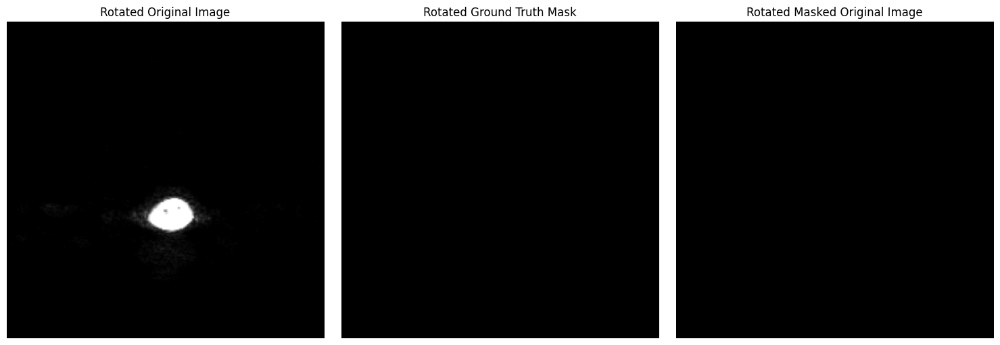

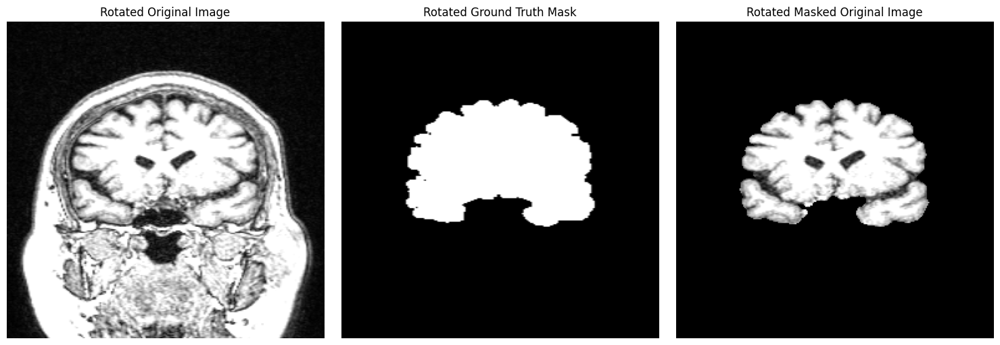

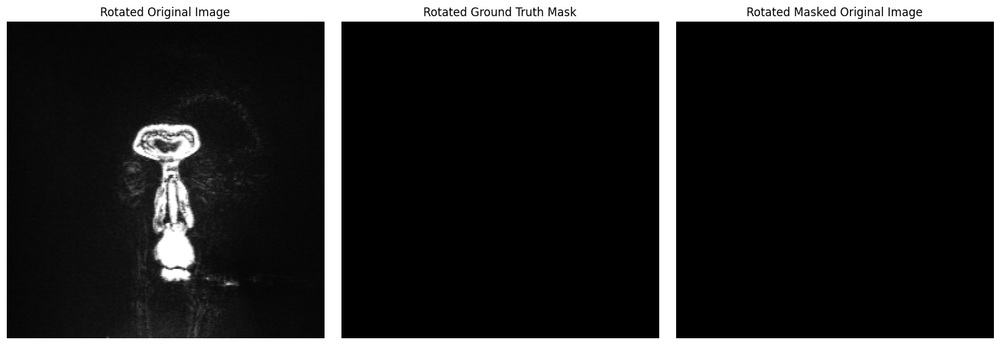

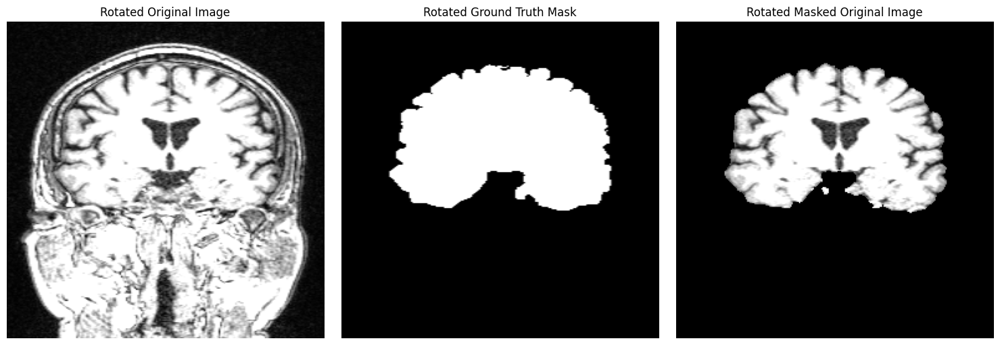

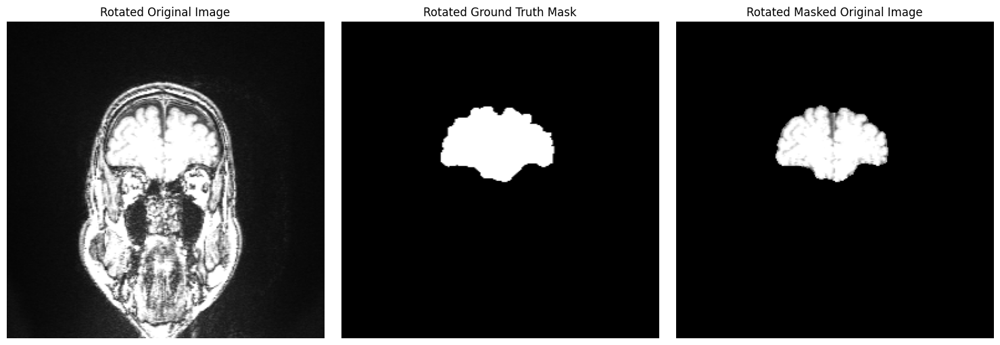

...

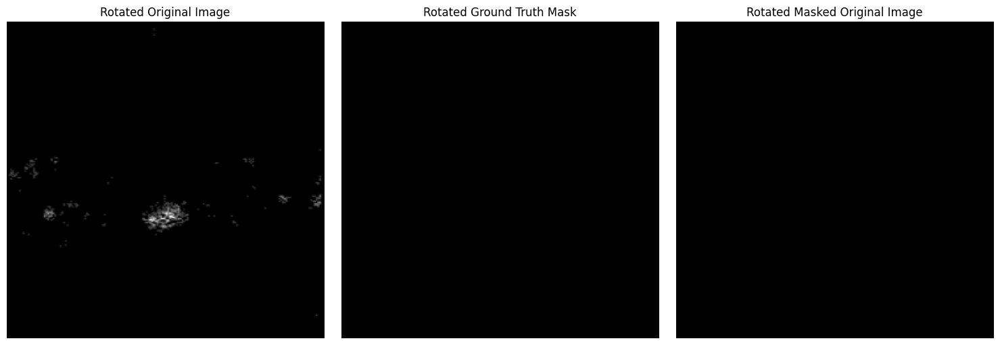

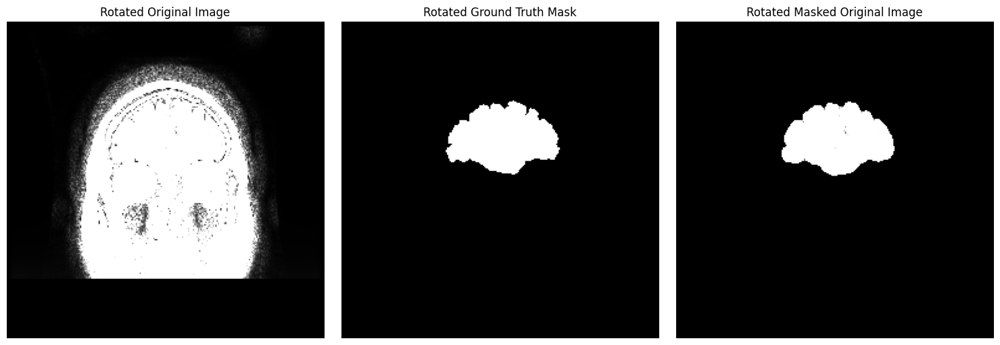

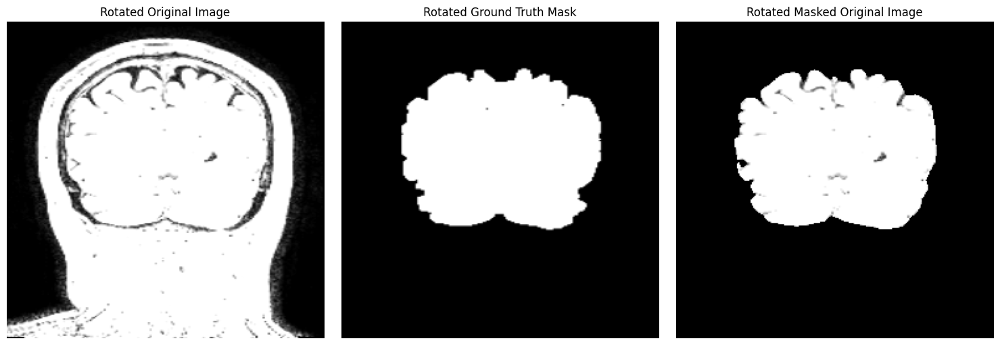

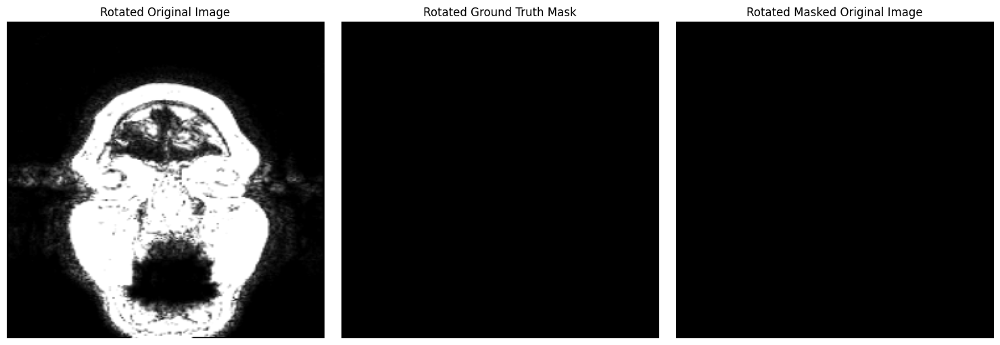

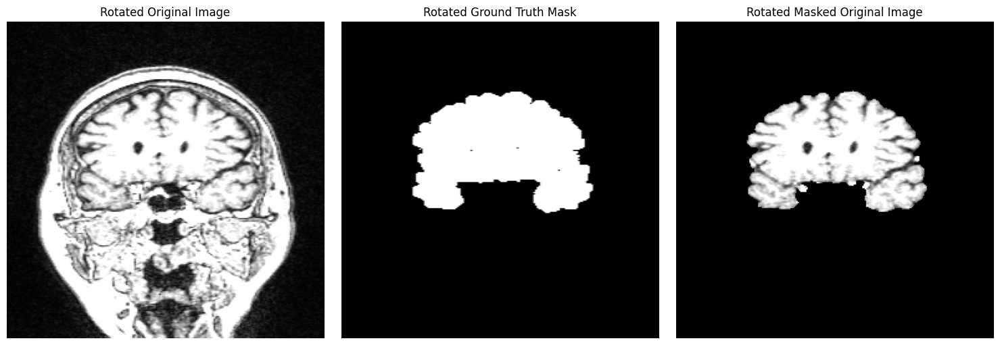

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# Assuming val_loader is your DataLoader for the validation set
# Make sure unet_model is set to evaluation mode and moved to the correct device
unet_model.eval()

# Number of random samples to display
num_samples = 21

# Generate random batch indices
num_batches = len(val_loader)  # Assuming val_loader has a defined length
random_batch_indices = np.random.choice(num_batches, size=num_samples, replace=False)

for batch_idx, (x, y_true) in enumerate(val_loader):
    if batch_idx in random_batch_indices:
        # Move data to the same device as the model
        x, y_true = x.to(device), y_true.to(device)
        
        with torch.no_grad():
            y_pred = unet_model(x)
            y_pred = torch.sigmoid(y_pred)  # Apply sigmoid to get probabilities
            y_pred_thresh = (y_pred > 0.5).float()  # Threshold predictions
            
        # Select a random sample index from the batch (all samples in the batch are potential candidates)
        sample_idx = np.random.randint(0, x.size(0))
        
        # Prepare the images, masks, and predictions for plotting
        image = x[sample_idx][0].cpu().numpy()  # Assuming the first channel is what you want to display
        mask_true = y_true[sample_idx][0].cpu().numpy()
        prediction = y_pred_thresh[sample_idx][0].cpu().numpy()
        
        # Squeeze the single-channel dimension if necessary
        image = np.squeeze(image)
        mask_true = np.squeeze(mask_true)
        prediction = np.squeeze(prediction)
        
        # Rotate the images 90 degrees to the left
        image_rotated = np.rot90(image, 1)  # Rotate 90 degrees to the left
        mask_true_rotated = np.rot90(mask_true, 1)
        prediction_rotated = np.rot90(prediction, 1)
        masked_image_rotated = image_rotated * prediction_rotated  # Apply rotated predicted mask to the rotated image
        
        # Plot
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(image_rotated, cmap='gray')
        axes[0].set_title("Rotated Original Image")
        axes[0].axis('off')

        axes[1].imshow(mask_true_rotated, cmap='gray')
        axes[1].set_title("Rotated Ground Truth Mask")
        axes[1].axis('off')

        axes[2].imshow(masked_image_rotated, cmap='gray')  # Show the rotated masked original image
        axes[2].set_title("Rotated Masked Original Image")
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()

        # Since we only want to display a fixed number of samples, break if we've reached that number
        if len(random_batch_indices) == 0:
            break


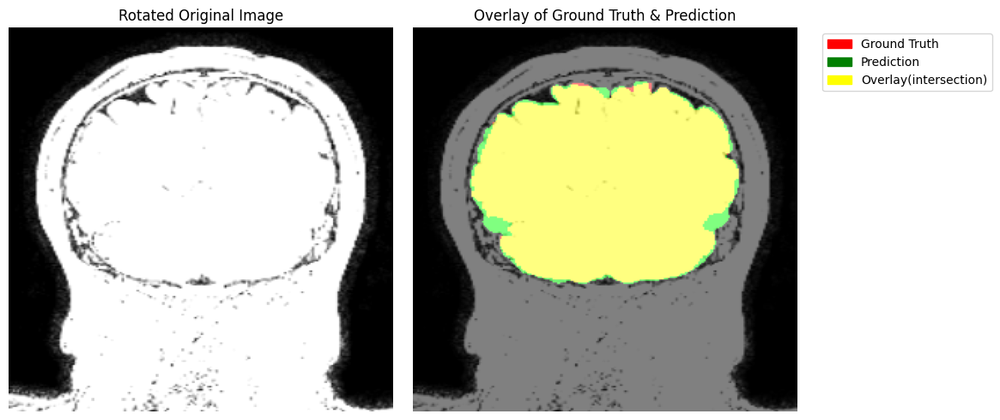

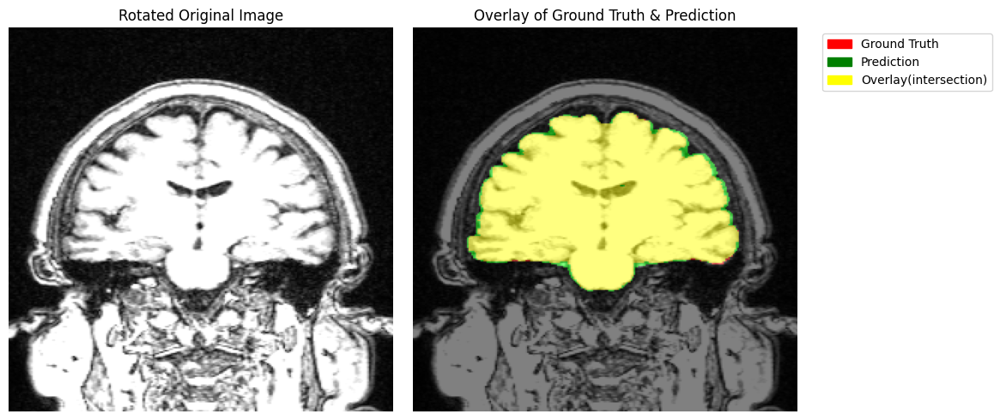

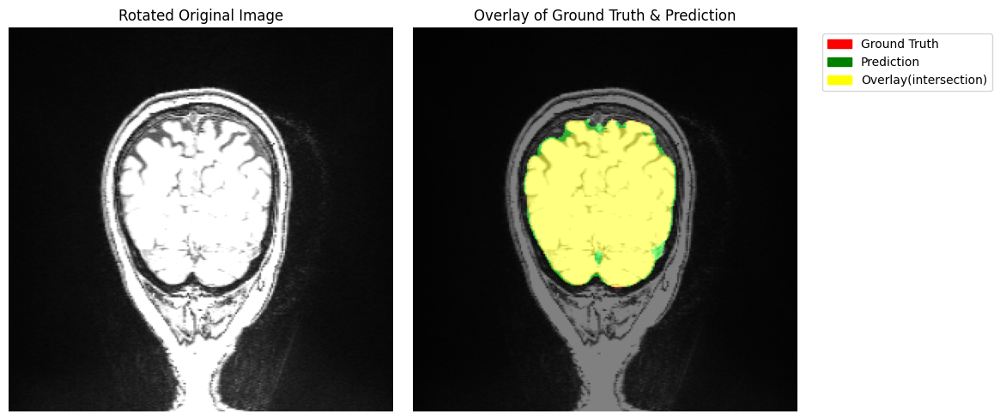

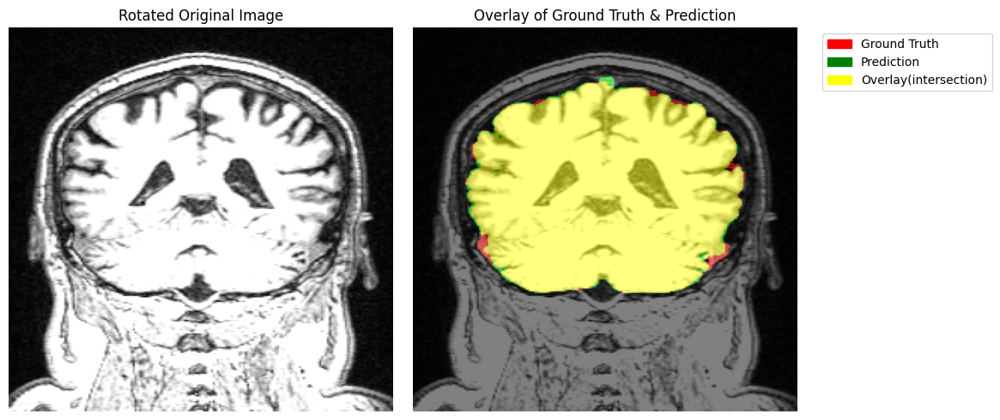

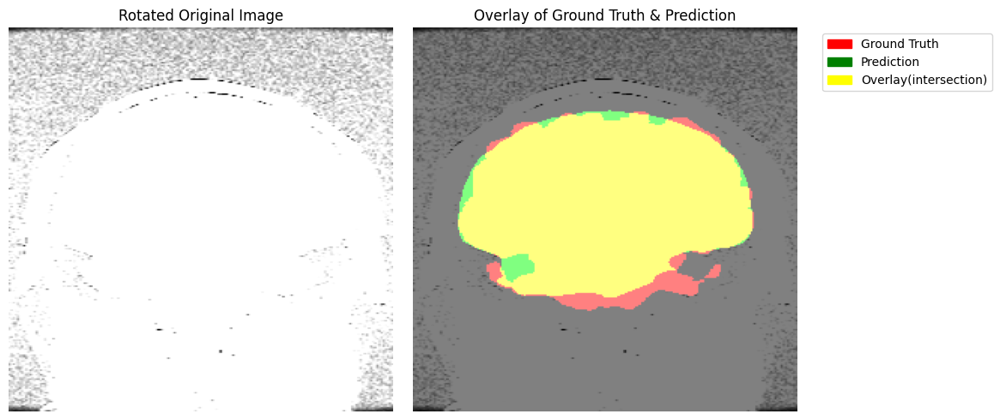

...

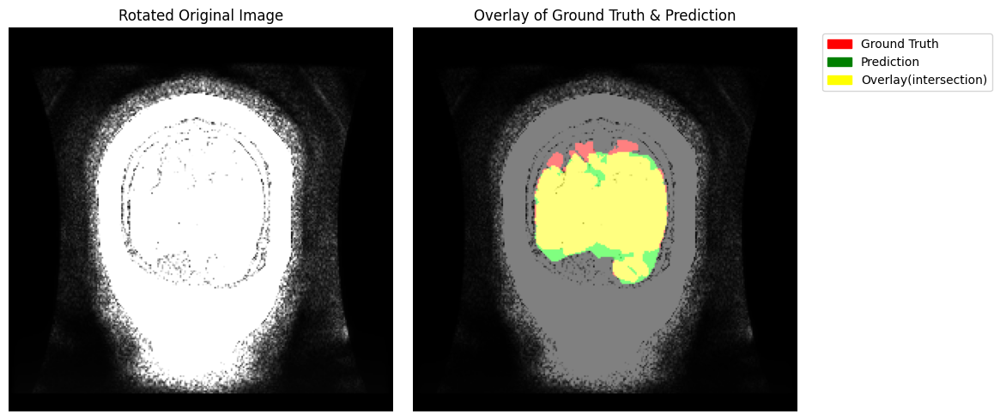

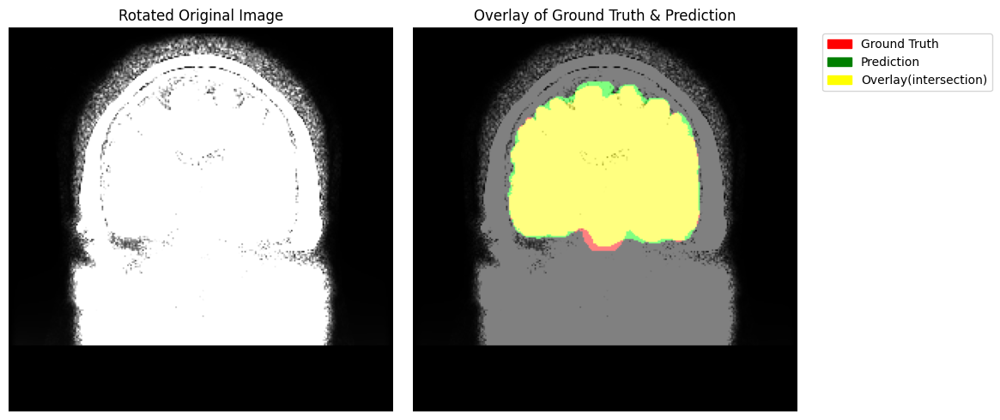

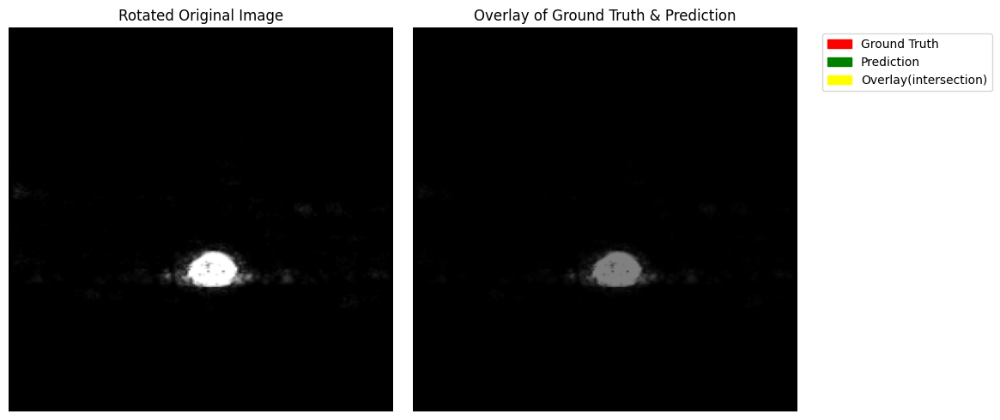

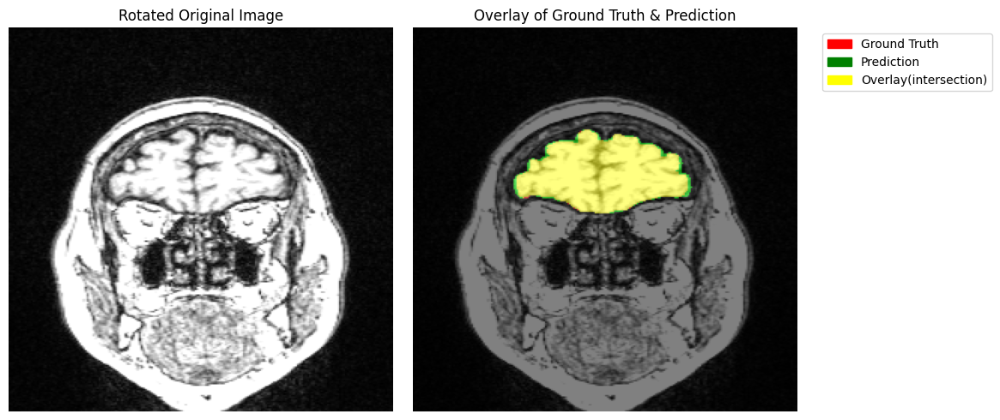

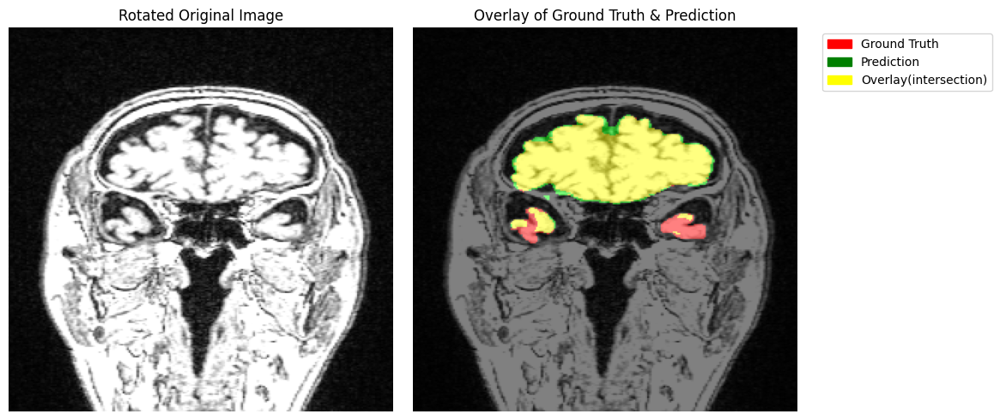

In [64]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# Assuming val_loader is your DataLoader for the validation set
# Make sure unet_model is set to evaluation mode and moved to the correct device
unet_model.eval()

# Number of random samples to display
num_samples = 21

# Generate random batch indices
num_batches = len(val_loader)  # Assuming val_loader has a defined length
random_batch_indices = np.random.choice(num_batches, size=num_samples, replace=False)

for batch_idx, (x, y_true) in enumerate(val_loader):
    if batch_idx in random_batch_indices:
        # Move data to the same device as the model
        x, y_true = x.to(device), y_true.to(device)
        
        with torch.no_grad():
            y_pred = unet_model(x)
            y_pred = torch.sigmoid(y_pred)  # Apply sigmoid to get probabilities
            y_pred_thresh = (y_pred > 0.5).float()  # Threshold predictions
            
        # Select a random sample index from the batch (all samples in the batch are potential candidates)
        sample_idx = np.random.randint(0, x.size(0))
        
        # Prepare the images, masks, and predictions for plotting
        image = x[sample_idx][0].cpu().numpy()  # Assuming the first channel is what you want to display
        mask_true = y_true[sample_idx][0].cpu().numpy()
        prediction = y_pred_thresh[sample_idx][0].cpu().numpy()
        
        # Squeeze the single-channel dimension if necessary and rotate 90 degrees to the left
        image = np.rot90(np.squeeze(image), 1)
        mask_true = np.rot90(np.squeeze(mask_true), 1)
        prediction = np.rot90(np.squeeze(prediction), 1)
        
        # Create an overlay for the ground truth and prediction masks with different colors
        overlay = np.zeros((*mask_true.shape, 4))  # Initialize an RGBA image
        overlay[mask_true == 1, 0] = 1  # Red channel for ground truth
        overlay[prediction == 1, 1] = 1  # Green channel for prediction
        overlay[:, :, 3] = 0.5  # Alpha channel for transparency
        
        # Plot
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # Adjusted to have only two plots
        axes[0].imshow(image, cmap='gray')
        axes[0].set_title("Rotated Original Image")
        axes[0].axis('off')

        # Plotting the base image and the overlay
        axes[1].imshow(image, cmap='gray')  # Base image for context
        axes[1].imshow(overlay)  # Overlay masks
        axes[1].set_title("Overlay of Ground Truth & Prediction")
        axes[1].axis('off')

        # Creating custom patches for the legend
        from matplotlib.patches import Patch
        legend_patches = [Patch(color='red', label='Ground Truth'),
                          Patch(color='green', label='Prediction'),
                         Patch(color='yellow', label='Overlay(intersection)')]
        axes[1].legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

        plt.tight_layout()
        plt.show()

        # Since we only want to display a fixed number of samples, break if we've reached that number
        if len(random_batch_indices) == 0:
            break
